In [5]:
import pandas as pd
DATASET_COLUMNS=['sentiment','id','date','query','user','tweet']
DATASET_ENCODING = "ISO-8859-1"
df=pd.read_csv('training.csv', encoding=DATASET_ENCODING, names=DATASET_COLUMNS)
df.head()

,sentiment,id,date,query,user,tweet
0,0,1467810369,Mon Apr 06 22:19:45 PDT 2009,NO_QUERY,_TheSpecialOne_,"@switchfoot http://twitpic.com/2y1zl - Awww, t..."
1,0,1467810672,Mon Apr 06 22:19:49 PDT 2009,NO_QUERY,scotthamilton,is upset that he can't update his Facebook by ...
2,0,1467810917,Mon Apr 06 22:19:53 PDT 2009,NO_QUERY,mattycus,@Kenichan I dived many times for the ball. Man...
3,0,1467811184,Mon Apr 06 22:19:57 PDT 2009,NO_QUERY,ElleCTF,my whole body feels itchy and like its on fire
4,0,1467811193,Mon Apr 06 22:19:57 PDT 2009,NO_QUERY,Karoli,"@nationwideclass no, it's not behaving at all...."


In [7]:
df=df.drop(['id','date','query','user'], axis=1)
df.head()

,sentiment,tweet
0,0,"@switchfoot http://twitpic.com/2y1zl - Awww, t..."
1,0,is upset that he can't update his Facebook by ...
2,0,@Kenichan I dived many times for the ball. Man...
3,0,my whole body feels itchy and like its on fire
4,0,"@nationwideclass no, it's not behaving at all...."


In [8]:
label_to_sentiment={0:'Negative',4:'Positive'}
def label_decoder(label):
    return label_to_sentiment[label]
df.sentiment=df.sentiment.apply(lambda x: label_decoder(x))

In [9]:
df.head()

,sentiment,tweet
0,Negative,"@switchfoot http://twitpic.com/2y1zl - Awww, t..."
1,Negative,is upset that he can't update his Facebook by ...
2,Negative,@Kenichan I dived many times for the ball. Man...
3,Negative,my whole body feels itchy and like its on fire
4,Negative,"@nationwideclass no, it's not behaving at all...."


<BarContainer object of 2 artists>

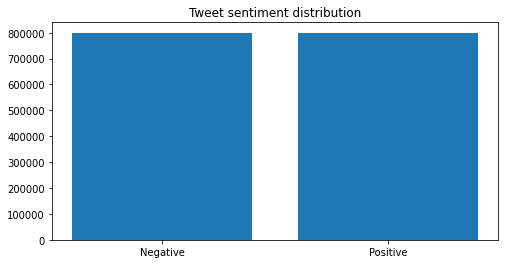

In [11]:
import matplotlib.pyplot as plt
distribution=df.sentiment.value_counts()
plt.figure(figsize=(8,4))
plt.title('Tweet sentiment distribution')
plt.bar(distribution.index, distribution.values)

### Text for Sentiment Analysis Preprocessing

In [12]:
# Import nltk package and download the stopwords
import nltk 
nltk.download('stopwords')
# We filter out the english language stopwrds
from nltk.corpus import stopwords
stop_words = stopwords.words('english')
print(stop_words)


['i', 'me', 'my', 'myself', 'we', 'our', 'ours', 'ourselves', 'you', "you're", "you've", "you'll", "you'd", 'your', 'yours', 'yourself', 'yourselves', 'he', 'him', 'his', 'himself', 'she', "she's", 'her', 'hers', 'herself', 'it', "it's", 'its', 'itself', 'they', 'them', 'their', 'theirs', 'themselves', 'what', 'which', 'who', 'whom', 'this', 'that', "that'll", 'these', 'those', 'am', 'is', 'are', 'was', 'were', 'be', 'been', 'being', 'have', 'has', 'had', 'having', 'do', 'does', 'did', 'doing', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'because', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'during', 'before', 'after', 'above', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'once', 'here', 'there', 'when', 'where', 'why', 'how', 'all', 'any', 'both', 'each', 'few', 'more', 'most', 'other', 'some', 'such', 'no', 'nor', 'not', 'only', 'own', 'same', 'so', 'than', '

[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/ballakeerthi/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [13]:
from nltk.stem import SnowballStemmer

stemmer = SnowballStemmer('english')

In [14]:
import re
text_cleaning_regex = "@S+|https?:S+|http?:S|[^A-Za-z0-9]+"

In [15]:
def clean_tweets(text, stem=False):
  # Text passed to the regex equatio
  text = re.sub(text_cleaning_regex, ' ', str(text).lower()).strip()
  # Empty list created to store final tokens
  tokens = []
  for token in text.split():
    # check if the token is a stop word or not
    if token not in stop_words:
      if stem:
        # Paased to the snowball stemmer
        tokens.append(stemmer.stem(token))
      else:
        # A
        tokens.append(token)
  return " ".join(tokens)

In [16]:
df.tweet = df.tweet.apply(lambda x: clean_tweets(x))


In [17]:
# Import functions from sklearn library
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
# Splitting the data into training and testing sets
train_data, test_data = train_test_split(df, test_size=0.2,random_state=16)
print("Train Data size:", len(train_data))
print("Test Data size", len(test_data))
#> Train Data size: 1280000
#> Test Data size 320000

Train Data size: 1280000
Test Data size 320000


### Tokenization & Label Encoding

In [22]:
from keras.preprocessing.text import Tokenizer
tokenizer = Tokenizer()

In [23]:
tokenizer.fit_on_texts(train_data.tweet)
word_index = tokenizer.word_index
print(word_index)

{'good': 1, 'day': 2, 'get': 3, 'like': 4, 'go': 5, 'quot': 6, 'http': 7, 'today': 8, 'work': 9, 'love': 10, 'going': 11, 'got': 12, 'lol': 13, 'time': 14, 'back': 15, 'u': 16, 'one': 17, 'com': 18, 'im': 19, 'know': 20, 'really': 21, 'amp': 22, 'see': 23, 'night': 24, 'still': 25, '2': 26, 'well': 27, 'new': 28, 'want': 29, 'think': 30, 'home': 31, 'thanks': 32, 'oh': 33, 'much': 34, 'miss': 35, 'need': 36, 'last': 37, 'morning': 38, 'tomorrow': 39, 'hope': 40, 'great': 41, 'twitter': 42, '3': 43, 'haha': 44, 'feel': 45, 'sad': 46, 'fun': 47, 'wish': 48, 'sleep': 49, 'right': 50, 'bad': 51, 'would': 52, 'happy': 53, 'sorry': 54, 'tonight': 55, 'make': 56, 'come': 57, 'way': 58, 'getting': 59, 'bit': 60, 'though': 61, 'gonna': 62, 'nice': 63, 'better': 64, 'watching': 65, 'yeah': 66, 'wait': 67, 'bed': 68, 'could': 69, 'week': 70, 'school': 71, 'twitpic': 72, 'people': 73, 'hate': 74, 'even': 75, 'hey': 76, 'days': 77, 'next': 78, 'weekend': 79, 'lt': 80, '4': 81, 'yes': 82, 'awesome':

In [24]:
vocab_size = len(tokenizer.word_index) + 1
print("Vocabulary Size :", vocab_size)
#> Vocabulary Size : 290415

Vocabulary Size : 565660


In [25]:
from keras.preprocessing.sequence import pad_sequences
# The tokens are converted into sequences and then passed to the pad_sequences() function
x_train = pad_sequences(tokenizer.texts_to_sequences(train_data.tweet),maxlen = 30)
x_test = pad_sequences(tokenizer.texts_to_sequences(test_data.tweet),maxlen = 30)

In [26]:
labels = ['Negative', 'Positive']
from sklearn.preprocessing import LabelEncoder
encoder = LabelEncoder()
encoder.fit(train_data.sentiment.to_list())
y_train = encoder.transform(train_data.sentiment.to_list())
y_test = encoder.transform(test_data.sentiment.to_list())
y_train = y_train.reshape(-1,1)
y_test = y_test.reshape(-1,1)

### GloVe Word EmBEDDINGS

In [28]:
import numpy as np
embeddings_index = {}
# opening the downloaded glove embeddings file
f = open('./glove/glove.6B.300d.txt')
for line in f:
    # For each line file, the words are split and stored in a list
    values = line.split()
    word = value = values[0]
    coefs = np.asarray(values[1:], dtype='float32')
    embeddings_index[word] = coefs
f.close()
print('Found %s word vectors.' %len(embeddings_index))

Found 400000 word vectors.


In [29]:
# creating an matrix with zeroes of shape vocab x embedding dimension
embedding_matrix = np.zeros((vocab_size, 300))
# Iterate through word, index in the dictionary
for word, i in word_index.items():
    # extract the corresponding vector for the vocab indice of same word
    embedding_vector = embeddings_index.get(word)
    if embedding_vector is not None:
        # Storing it in a matrix
        embedding_matrix[i] = embedding_vector

In [30]:
import tensorflow as tf
embedding_layer = tf.keras.layers.Embedding(vocab_size,300,weights=[embedding_matrix],
                                          input_length=30,trainable=False)

### Model architecture

In [31]:
# Import various layers needed for the architecture from keras
from tensorflow.keras.layers import Conv1D, Bidirectional, LSTM, Dense, Input, Dropout
from tensorflow.keras.layers import SpatialDropout1D
from tensorflow.keras.callbacks import ModelCheckpoint
# The Input layer 
sequence_input = Input(shape=(30,), dtype='int32')
# Inputs passed to the embedding layer
embedding_sequences = embedding_layer(sequence_input)
# dropout and conv layer 
x = SpatialDropout1D(0.2)(embedding_sequences)
x = Conv1D(64, 5, activation='relu')(x)
# Passed on to the LSTM layer
x = Bidirectional(LSTM(64, dropout=0.2, recurrent_dropout=0.2))(x)
x = Dense(512, activation='relu')(x)
x = Dropout(0.5)(x)
x = Dense(512, activation='relu')(x)
# Passed on to activation layer to get final output
outputs = Dense(1, activation='sigmoid')(x)
model = tf.keras.Model(sequence_input, outputs)

2022-01-13 20:41:10.640918: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


### Model training and results

In [33]:
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ReduceLROnPlateau
LR=0.5
model.compile(optimizer=Adam(learning_rate=LR), loss='binary_crossentropy',metrics=['accuracy'])
ReduceLROnPlateau = ReduceLROnPlateau(factor=0.1,min_lr = 0.01, monitor = 'val_loss',verbose = 1)

In [35]:
training = model.fit(x_train, y_train, batch_size=1024, epochs=10,
                    validation_data=(x_test, y_test), callbacks=[ReduceLROnPlateau])

Epoch 1/10
1250/1250 [==============================] - 771s 616ms/step - loss: 0.6965 - accuracy: 0.5005 - val_loss: 0.6936 - val_accuracy: 0.4994 - lr: 0.5000
Epoch 2/10
1250/1250 [==============================] - 4759s 4s/step - loss: 0.6953 - accuracy: 0.5000 - val_loss: 0.6944 - val_accuracy: 0.4994 - lr: 0.5000
Epoch 3/10
1250/1250 [==============================] - 33207s 27s/step - loss: 0.6948 - accuracy: 0.5004 - val_loss: 0.6934 - val_accuracy: 0.5006 - lr: 0.5000
Epoch 4/10
1250/1250 [==============================] - 1284s 1s/step - loss: 0.6946 - accuracy: 0.4995 - val_loss: 0.6936 - val_accuracy: 0.5006 - lr: 0.5000
Epoch 5/10
1250/1250 [==============================] - 3174s 3s/step - loss: 0.6943 - accuracy: 0.4998 - val_loss: 0.6932 - val_accuracy: 0.4994 - lr: 0.5000
Epoch 6/10
1250/1250 [==============================] - ETA: 0s - loss: 0.6942 - accuracy: 0.4994

### Evaluation of the Sentiment Analysis Model

In [ ]:
def predict_tweet_sentiment(score):
    return "Positive" if score>0.5 else "Negative"
scores = model.predict(x_test, verbose=1, batch_size=10000)
model_predictions = [predict_tweet_sentiment(score) for score in scores]

In [ ]:
from sklearn.metrics import classification_report
print(classification_report(list(test_data.sentiment), model_predictions))